In [1]:
import os
import cv2
import numpy as np
from sklearn.cluster import KMeans
import sklearn.metrics.cluster as sk
from scipy.optimize import linear_sum_assignment
from matplotlib import pyplot as plt
from scipy import io
import warnings

warnings.filterwarnings('ignore')

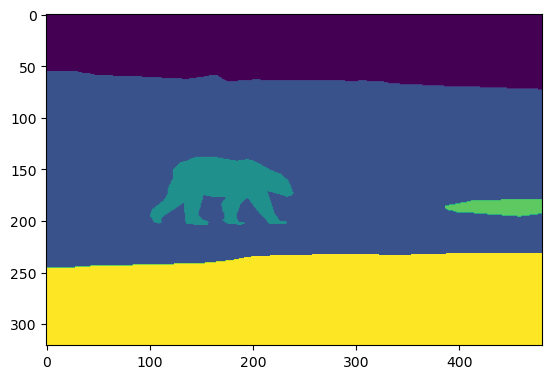

(321, 481)
[1 2 3 4 5]


In [2]:
IMAGES_COUNT = 5

gt_path = 'D:\\Projects\\Python_Projects\\ML\\ImageSegmentation\\BSR\\BSDS500\\data\\groundTruth\\test'
pics = os.listdir(gt_path)[0:50]

# create ground truth array

groundTruth = []

for filename in pics:

    data = io.loadmat(os.path.join(gt_path, filename))
    c = data['groundTruth'].shape[1]

    groundTruthPerImage = []
    for n in range(c):
        edge_data = data['groundTruth'][0][n][0][0][0]
        groundTruthPerImage.append(edge_data)

    groundTruthPerImage = np.array(groundTruthPerImage)
    groundTruth.append(groundTruthPerImage)

groundTruth = np.array(groundTruth)

plt.imshow(groundTruth[0][0])
plt.show()
print(groundTruth[0][0].shape)
print(np.unique(groundTruth[0][0]))

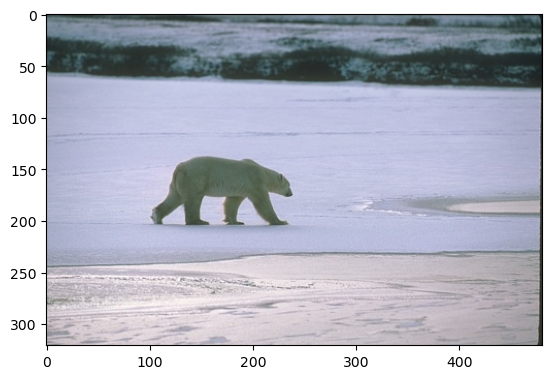

In [3]:
# original images

images = []
images_path = "D:\\Projects\\Python_Projects\\ML\\ImageSegmentation\\BSR\\BSDS500\\data\\images\\test\\"
pics = os.listdir(images_path)[0:50]

for filename in pics:
    img = cv2.imread(os.path.join(images_path, filename))
    im_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(im_rgb)

images = np.array(images, dtype=object)
plt.imshow(images[0])
plt.show()

flattened_images = np.empty((0, 3))
flattened_images_list = []

for i in range(IMAGES_COUNT):
    flattened_image = images[i].reshape(images[i].shape[0] * images[i].shape[1], images[i].shape[2])
    flattened_images_list.append(flattened_image)


In [4]:
def recreate_groundTruth(image_index, gt_index, flat_segmented_images, k):
    flattened_gt = np.array(groundTruth[image_index][gt_index]).reshape(
        images[image_index].shape[0] * images[image_index].shape[1], 1)

    # add dummy classes to match k clusters in case ground truth clusters < k
    max_gt = flattened_gt.max()
    if max_gt < k:
        j = 1
        for i in range(max_gt, k + 1):
            flattened_gt[i][0] = max_gt + j
            j += 1

    # add dummy classes to match k clusters in case k_means classes < k
    max_seg = flat_segmented_images.max()
    if max_seg < k:
        j = 1
        for i in range(max_seg, k + 1):
            flat_segmented_images[i] = max_seg + j
            j += 1

    contingency_matrix = sk.contingency_matrix(flattened_gt, flat_segmented_images)
    gt_clusters = contingency_matrix.shape[0]

    # max matching

    idx = linear_sum_assignment(-contingency_matrix.T)[1]
    for i in range(k):
        contingency_matrix[[idx[i], i]] = contingency_matrix[[i, idx[i]]]
        replaced_index = np.argwhere(flattened_gt == (idx[i] + 1))
        # give the major k clusters new values
        flattened_gt[replaced_index] = gt_clusters + i + 1

    # give the minor clusters (which will be merged into the major clusters) new values
    values_gt = np.unique(flattened_gt)
    for i in range(gt_clusters - k):
        replaced_index = np.argwhere(flattened_gt == (values_gt[i]))
        flattened_gt[replaced_index] = gt_clusters + k + i + 1

    # merge the minor clusters into the major clusters
    contingency_matrix = sk.contingency_matrix(flattened_gt, flat_segmented_imgs[image_index])
    for i in range(k, gt_clusters):
        replaced_index = np.argwhere(flattened_gt == (gt_clusters + i + 1))
        flattened_gt[replaced_index] = gt_clusters + np.argmax(contingency_matrix[i]) + 1
        contingency_matrix[np.argmax(contingency_matrix[i])] += contingency_matrix[i]
    contingency_matrix = contingency_matrix[:k, :]

    new_gt = flattened_gt.reshape((images[image_index].shape[0], images[image_index].shape[1]))

    return new_gt, contingency_matrix


In [5]:
def KMeans_scratch(k, flattened_image):

    rand_indices = np.array([0 for i in range(k)])
    # makes sure that the centroids are different in values so that no 2 clusters are merged into 1
    for i in range(k):
        for j in range(i + 1, k):
            while np.all(flattened_image[rand_indices[i]] == flattened_image[rand_indices[j]]):
                rand_indices = np.random.randint(low=flattened_image.shape[0] / 4,
                                                 high=flattened_image.shape[0] - (flattened_image.shape[0] / 4), size=k)

    # generate the k random centroids
    centroids = flattened_image[rand_indices]

    distances_to_centroids = np.zeros((flattened_image.shape[0], k))
    # iterate 100 time
    for itr in range(100):

        for i in range(k):
            distances_to_centroids[:, i] = np.linalg.norm(flattened_image - centroids[i], axis=1)

        pixels_labels = np.argmin(distances_to_centroids, axis=1)

        new_centroids = np.array([flattened_image[pixels_labels == i].mean(axis=0) for i in range(k)])

        # break if no update in centroids
        if np.all(centroids == new_centroids):
            break

        # update centroids
        centroids = new_centroids

    return pixels_labels


In [6]:
# k = 3 5 7 9 11
def image_segmentation(k):
    segmented_images = []
    flat_segmented_images = []

    # k_means = KMeans(n_clusters=k)

    for i in range(IMAGES_COUNT):
        # k_means.fit(flattened_images_list[i])
        # labels = k_means.labels_
        # flat_segmentation = labels.reshape(labels.shape[0], 1)

        flat_segmentation = KMeans_scratch(k, flattened_images_list[i])
        segmented_images.append(flat_segmentation.reshape(images[i].shape[0], images[i].shape[1]))
        flat_segmented_images.append(flat_segmentation)

    flat_segmented_images = np.array(flat_segmented_images, dtype=object)

    return segmented_images, flat_segmented_images


In [7]:
def evaluate_segmentation(image_index, gt_index, flat_segmented_images, k):
    new_gt, contingency_matrix = recreate_groundTruth(image_index, gt_index, flat_segmented_images, k)

    # calculate F-score

    precision = np.zeros((k, 1))
    recall = np.zeros((k, 1))
    f_score = np.zeros((k, 1))

    for i in range(k):
        TP = np.amax(contingency_matrix[:, i])
        precision[i] = TP / np.sum(contingency_matrix[:, i])
        recall[i] = TP / np.sum(contingency_matrix[i])

        f_score[i] = (2 * precision[i] * recall[i]) / (precision[i] + recall[i])

    f_score_avg = np.mean(f_score)

    #############################################################################

    # calculate conditional Entropy

    pixels_count = images[image_index].shape[0] * images[image_index].shape[1]
    entropy = 0
    for i in range(k):
        sum_cluster = np.sum(contingency_matrix[:, i])

        H_cluster = 0
        for j in range(k):
            n_ij = contingency_matrix[i][j]
            if n_ij != 0:
                H_cluster += (n_ij / pixels_count) * np.log10(n_ij / sum_cluster)

        entropy -= H_cluster

    #############################################################################

    return f_score_avg, entropy, new_gt


for k = 3 : F-score per dataset: 0.700384303701165   Entropy per dataset: 0.22974313865035162
for k = 5 : F-score per dataset: 0.7126724731237075   Entropy per dataset: 0.3267232444657665
for k = 7 : F-score per dataset: 0.8212091777197834   Entropy per dataset: 0.34193482031038436
for k = 9 : F-score per dataset: 0.8995576026400259   Entropy per dataset: 0.3311722077087836
for k = 11 : F-score per dataset: 0.998261040151777   Entropy per dataset: 0.40888744887144757


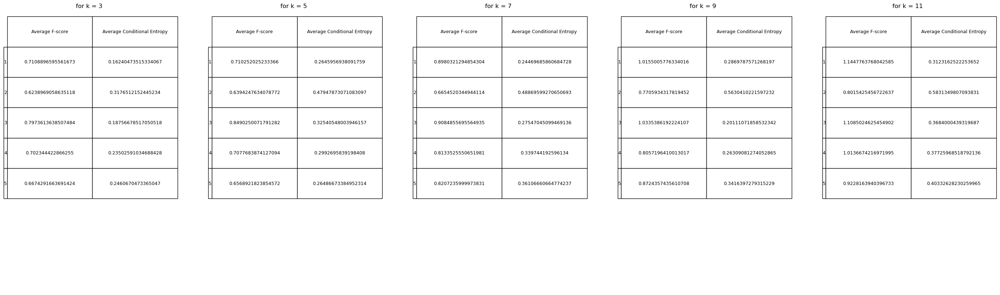

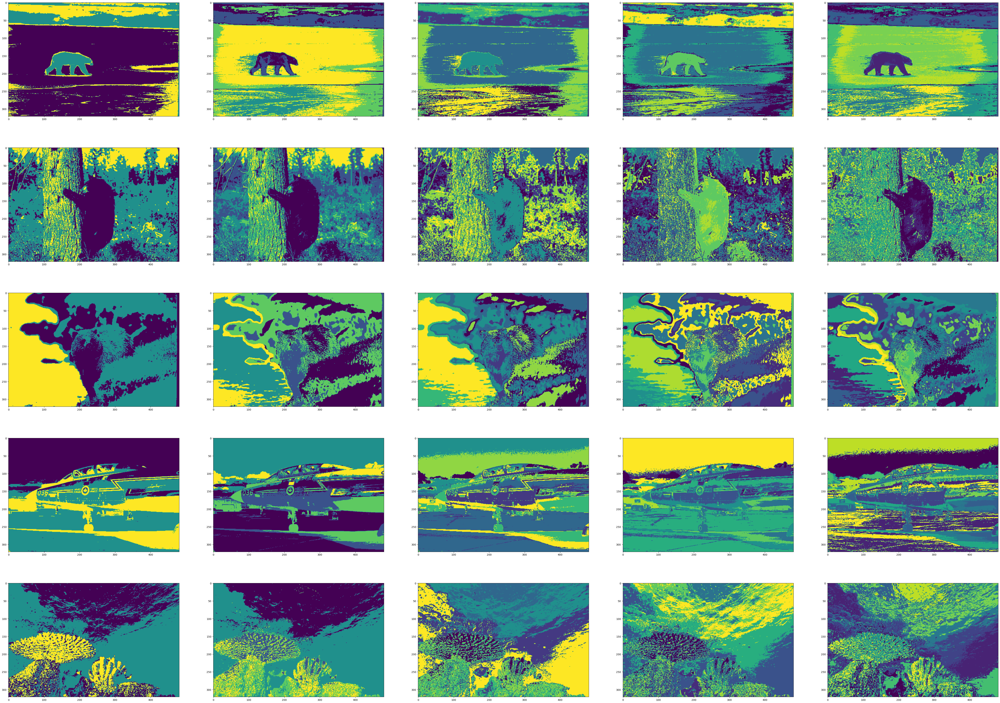

In [8]:
k_clusters = [3, 5, 7, 9, 11]

fig, ax = plt.subplots(1, 5, figsize=(35, 10))
seg_fig, seg_axs = plt.subplots(IMAGES_COUNT, 5, figsize=(70, IMAGES_COUNT* 10))

for k in k_clusters:

    plot = k_clusters.index(k)

    F_score_entropy_list = np.zeros((IMAGES_COUNT, 2))
    segmented_imgs, flat_segmented_imgs = image_segmentation(k=k)

    for img_index in range(IMAGES_COUNT):
        seg_axs[img_index][plot].imshow(segmented_imgs[img_index])

        seg_f_score_avg = 0
        seg_entropy_avg = 0
        gt_count = len(groundTruth[img_index])

        for gt_img_index in range(gt_count):
            F_score, Entropy, _ = evaluate_segmentation(img_index, gt_img_index, flat_segmented_imgs[img_index], k=k)
            seg_f_score_avg += F_score
            seg_entropy_avg += Entropy

        seg_f_score_avg /= gt_count
        seg_entropy_avg /= gt_count

        F_score_entropy_list[img_index][0] = seg_f_score_avg
        F_score_entropy_list[img_index][1] = seg_entropy_avg

    print("for k = {} : F-score per dataset: {}   Entropy per dataset: {}".format(k, np.sum(
        F_score_entropy_list[:, 0]) / IMAGES_COUNT, np.sum(F_score_entropy_list[:, 1]) / IMAGES_COUNT))

    ax[plot].set_axis_off()
    table = ax[plot].table(
        cellText=F_score_entropy_list,
        rowLabels=[r + 1 for r in range(IMAGES_COUNT)],
        colLabels=["Average F-score", "Average Conditional Entropy"],
        cellLoc='center',
        loc='upper left')
    table.scale(1, 5)
    ax[plot].set_title('for k = {}'.format(k))

plt.show()

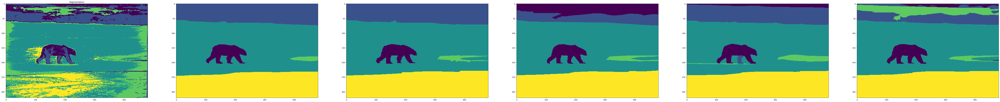

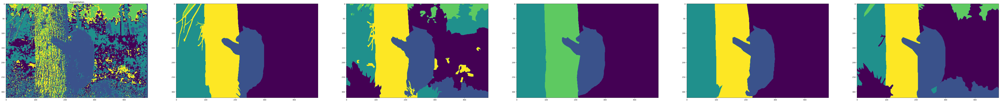

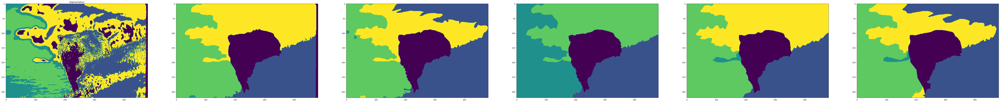

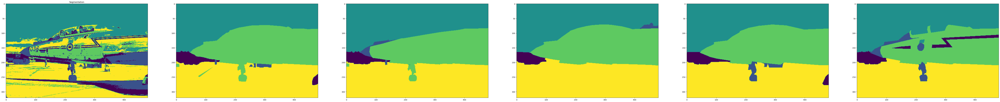

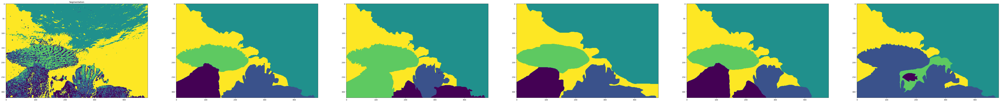

In [9]:
# segmentation against ground truth

segmented_imgs, flat_segmented_imgs = image_segmentation(k=5)

for img_index in range(IMAGES_COUNT):
    fig, axs = plt.subplots(1, 6, figsize=(100, 20))
    axs[0].imshow(segmented_imgs[img_index] + 1)
    axs[0].set_title("Segmentation")

    for gt_img_index in range(len(groundTruth[img_index])):
        _, _, _new_gt = evaluate_segmentation(img_index, gt_img_index, flat_segmented_imgs[img_index], k=5)
        axs[gt_img_index + 1].imshow(_new_gt)